In [17]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from numpy import median
matlab = ["#0073bd", "#d9541a", "#78ab30", "#edb021"]
color_codes_wanted = ['blue', 'red', 'green', 'orange']
c = lambda x: matlab[color_codes_wanted.index(x)]

df = pd.DataFrame(columns=('Type', 'Ratio', 'Times', 'gid', 'k', 'Number of CPU Cores', 'Memory Constraints', 'Isolation Level'))

cores = [2,    3,   4,    5,   6]
mem   = [1, 0.95, 0.9, 0.85,  0.8, 0.75]
isol  = [1.5,  3,   5,  7.5, 10.5]
tests = [[0, 2, 1], [1, 2, 1], [2, 2, 1], [3, 2, 1], [4, 2, 1], [2, 0, 1], [2, 1, 1], [2, 3, 1], [2, 4, 1], [2, 5, 1], [2, 2, 0], [2, 2, 2], [2, 2, 3], [2, 2, 4]]
algo = 'heft'

In [18]:
from math import ceil
df = pd.read_csv('./results_'+algo+'/df_'+algo+'.csv')
df = df.rename(columns={'Ratio': 'EDER'})
df = df.rename(columns={'Times': 'DOR'})
gg = [0, 12, 25, 41, 19]
con = [3, 4, 5, 6, 7]
df['DOR'] = df.apply(lambda row: (row['DOR']-ceil(gg[row['gid']]/con[tests[row['k']][2]]))/(gg[row['gid']]-ceil(gg[row['gid']]/con[tests[row['k']][2]])), axis=1)

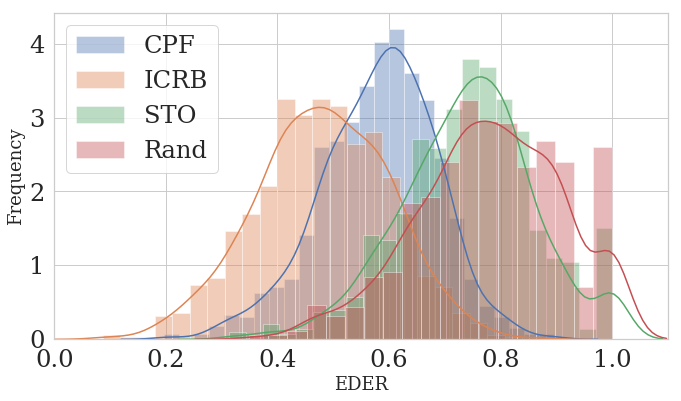

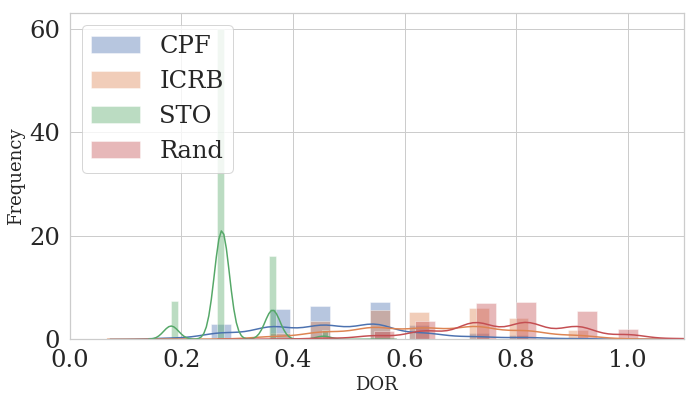

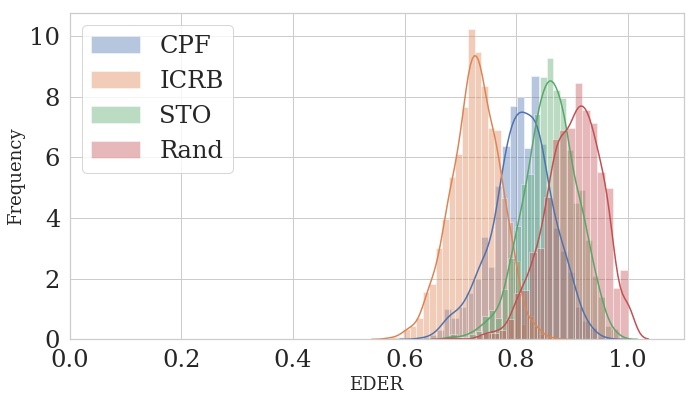

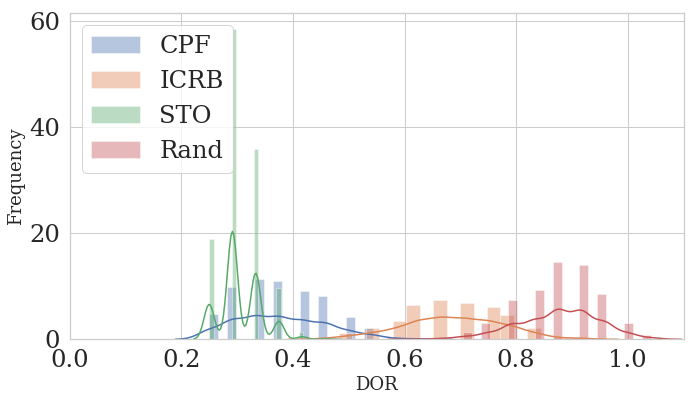

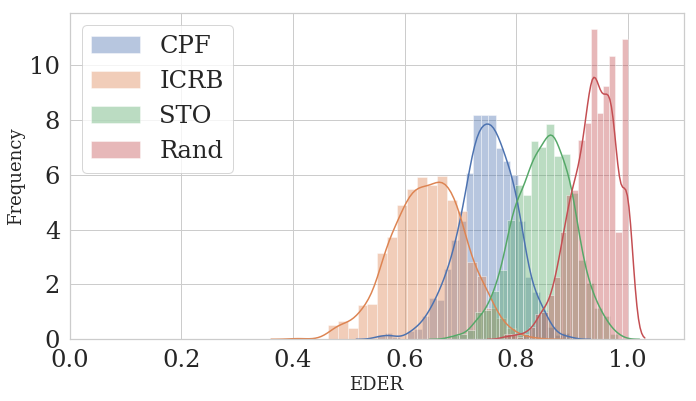

...

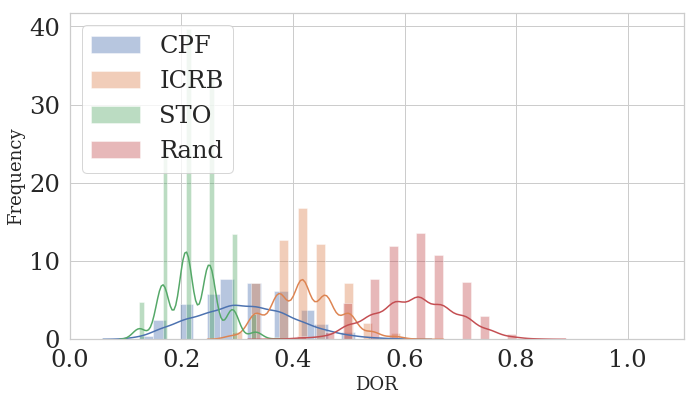

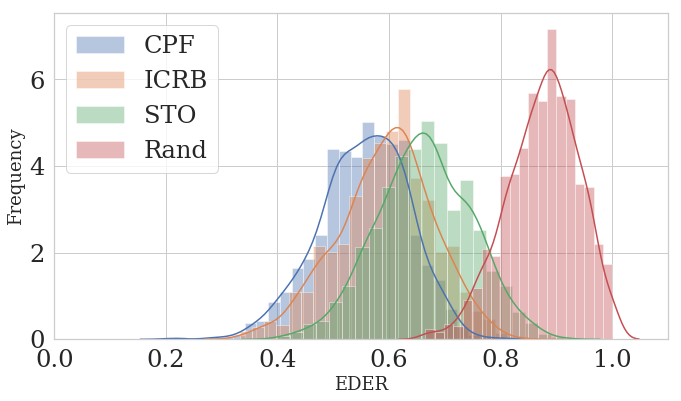

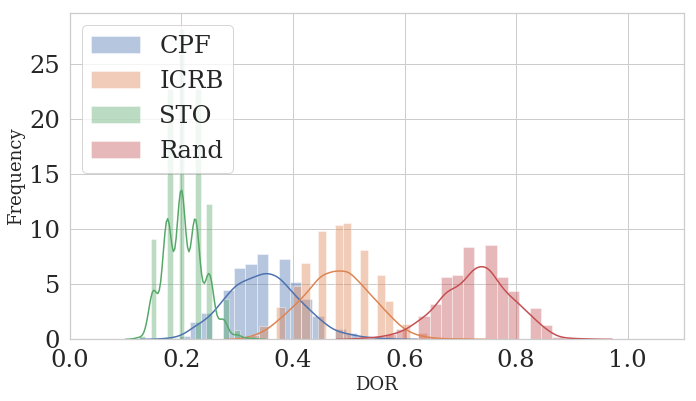

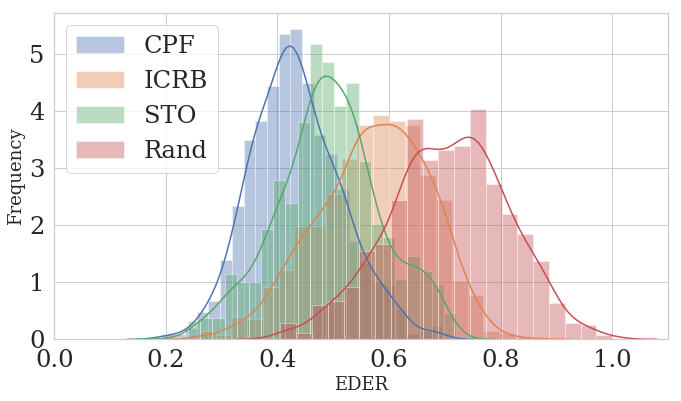

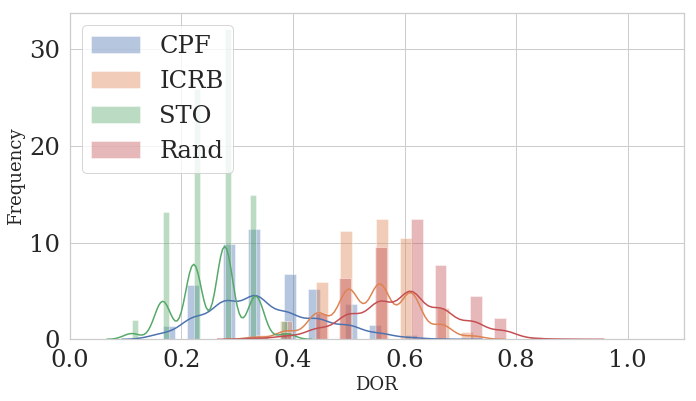

In [3]:
def draw_distro_hist(k, gid):
    data = df[(df['k'] == k) & (df['gid'] == gid)]
    draw_distro_hist_helper(data, 'EDER', (0, 1.1))
    draw_distro_hist_helper(data, 'DOR', (0, 1.1))

def draw_distro_hist_helper(data, var, rng):
    plt.figure(figsize = (11,6))
    sns.set(font_scale = 2.2)
    sns.set_style('whitegrid', {'font.family':'serif', 'font.serif':'Times New Roman'})
    sns.distplot(data[data['Type'] == 'CPF'][var].values, label = 'CPF', hist=True)#, color=c("blue"))
    sns.distplot(data[data['Type'] == 'ICRB'][var].values, label = 'ICRB', hist=True)#, color=c("green"))
    sns.distplot(data[data['Type'] == 'STO'][var].values, label = 'STO', hist=True)#, color=c("orange"))
    g = sns.distplot(data[data['Type'] == 'Rand'][var].values, label = 'Rand', hist=True)#, color=c("red"))
    g.set_xlabel(var, fontsize=18)
    g.set_ylabel("Frequency", fontsize=18)
    g.set(ylim=(0, None), xlim=rng)
    plt.legend(loc='upper left')
    plt.show()
    fig = g.get_figure()
    fig.savefig('./results_'+algo+'/distro_hist/' + str(gid) + '_' + str(k) + '_' + var + 'distro.eps')

for k in range(14):
    for gid in [1, 2, 3, 4]:
        draw_distro_hist(k, gid)

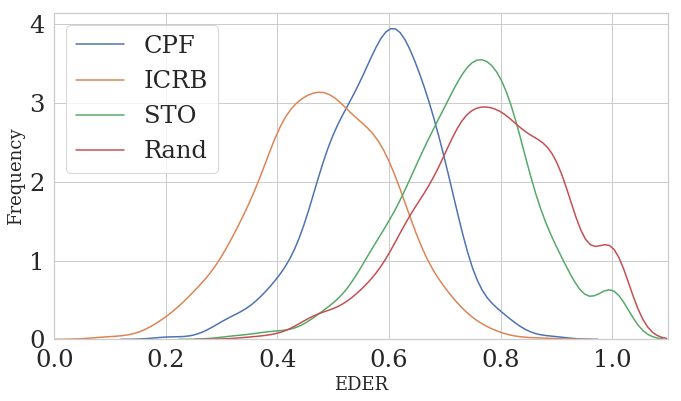

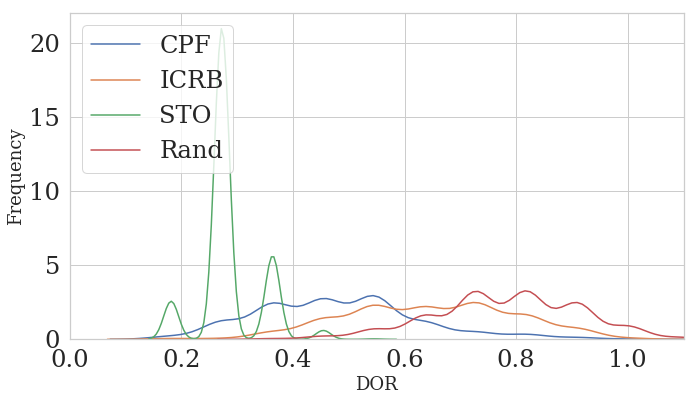

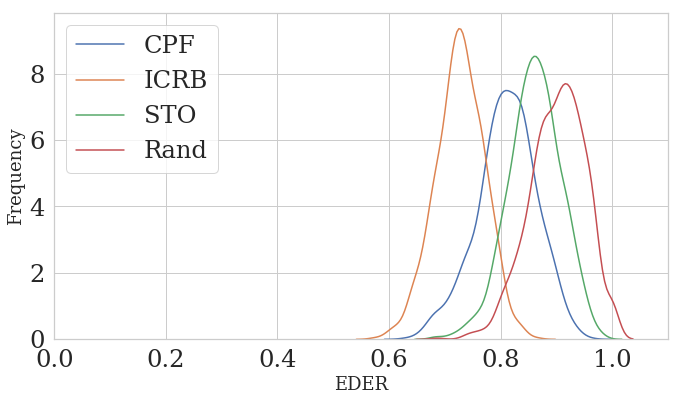

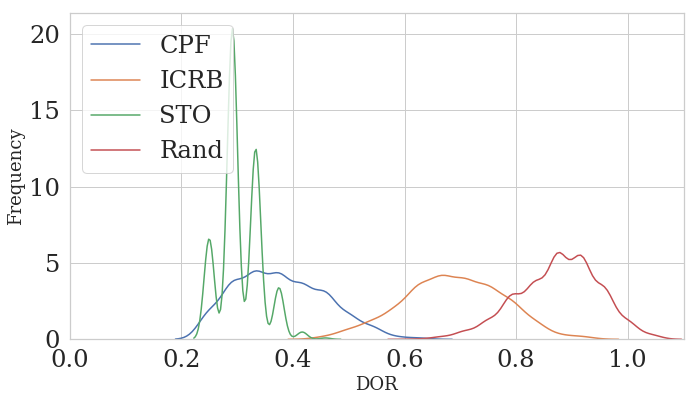

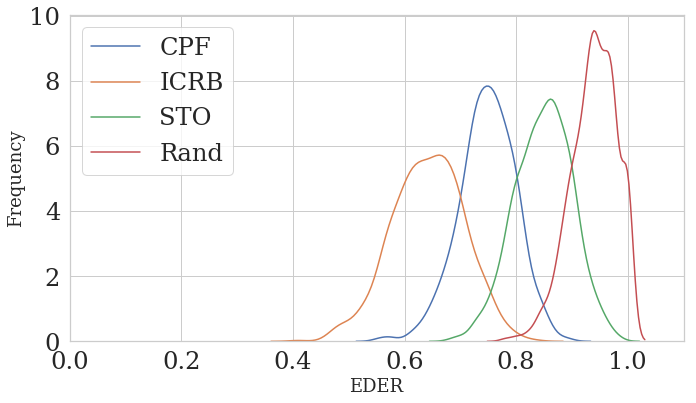

...

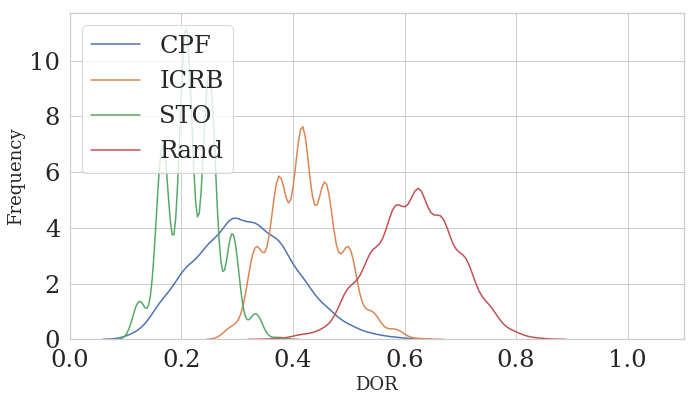

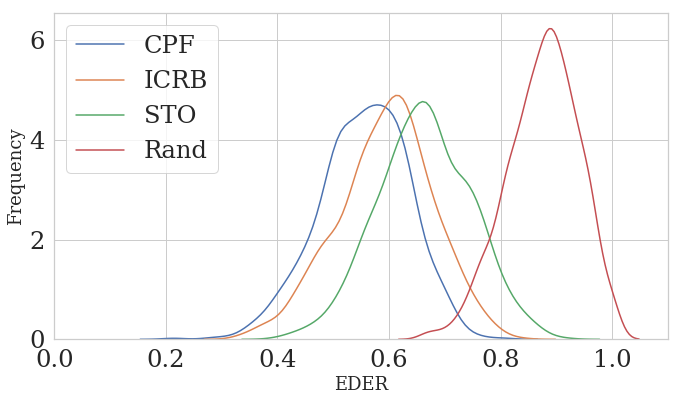

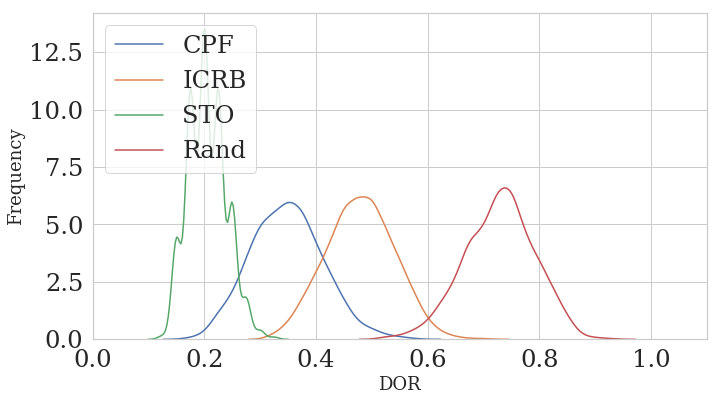

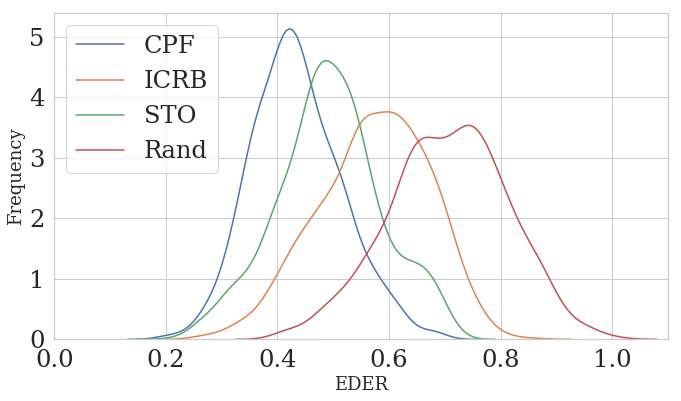

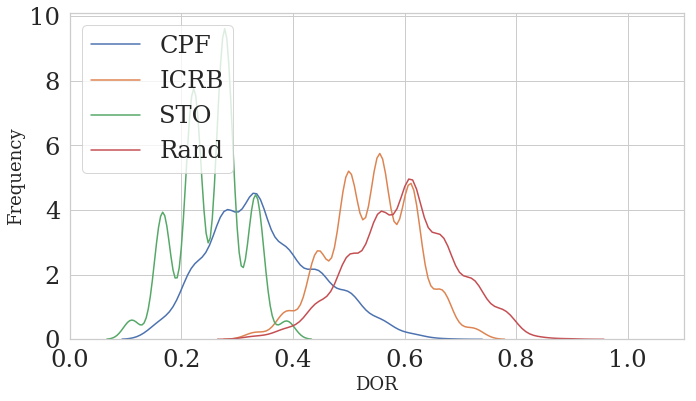

In [4]:
def draw_distro(k, gid):
    data = df[(df['k'] == k) & (df['gid'] == gid)]
    draw_distro_helper(data, 'EDER', (0, 1.1))
    draw_distro_helper(data, 'DOR', (0, 1.1))

def draw_distro_helper(data, var, rng):
    plt.figure(figsize = (11,6))
    sns.set(font_scale = 2.2)
    sns.set_style('whitegrid', {'font.family':'serif', 'font.serif':'Times New Roman'})
    sns.distplot(data[data['Type'] == 'CPF'][var].values, label = 'CPF', hist=False)#, color=c("blue"))
    sns.distplot(data[data['Type'] == 'ICRB'][var].values, label = 'ICRB', hist=False)#, color=c("green"))
    sns.distplot(data[data['Type'] == 'STO'][var].values, label = 'STO', hist=False)#, color=c("orange"))
    g = sns.distplot(data[data['Type'] == 'Rand'][var].values, label = 'Rand', hist=False)#, color=c("red"))
    g.set_xlabel(var, fontsize=18)
    g.set_ylabel("Frequency", fontsize=18)
    g.set(ylim=(0, None), xlim=rng)
    plt.legend(loc='upper left')
    plt.show()
    fig = g.get_figure()
    fig.savefig('./results_'+algo+'/distro_no_hist/' + str(gid) + '_' + str(k) + '_' + var + 'distro.eps')

for k in range(14):
    for gid in [1, 2, 3, 4]:
        draw_distro(k, gid)

In [5]:
"""
def draw_box_core(gid, xaxis, yaxis, d):
    plt.figure(figsize = (5, 10))
    cnt = 0
    sns.set(font_scale = 1.4)
    sns.set_style('whitegrid', {'font.family':'serif', 'font.serif':'Times New Roman'})
    fig = sns.catplot(x=xaxis, y=yaxis, hue="Type", data=d, kind="box")
    fig.savefig('./results_'+algo'/box/' + str(gid) + '_' + xaxis + '_' + yaxis + 'box.eps')
    
data = df[(df['k'] == 0) | (df['k'] == 1) | (df['k'] == 2) | (df['k'] == 3) | (df['k'] == 4)]
for gid in [1, 2, 3, 4]:
    draw_box_core(gid, 'Number of CPU Cores', 'Ratio', data)
    draw_box_core(gid, 'Number of CPU Cores', 'Times', data)
"""

'\ndef draw_box_core(gid, xaxis, yaxis, d):\n    plt.figure(figsize = (5, 10))\n    cnt = 0\n    sns.set(font_scale = 1.4)\n    sns.set_style(\'whitegrid\', {\'font.family\':\'serif\', \'font.serif\':\'Times New Roman\'})\n    fig = sns.catplot(x=xaxis, y=yaxis, hue="Type", data=d, kind="box")\n    fig.savefig(\'./results_\'+algo\'/box/\' + str(gid) + \'_\' + xaxis + \'_\' + yaxis + \'box.eps\')\n    \ndata = df[(df[\'k\'] == 0) | (df[\'k\'] == 1) | (df[\'k\'] == 2) | (df[\'k\'] == 3) | (df[\'k\'] == 4)]\nfor gid in [1, 2, 3, 4]:\n    draw_box_core(gid, \'Number of CPU Cores\', \'Ratio\', data)\n    draw_box_core(gid, \'Number of CPU Cores\', \'Times\', data)\n'

In [6]:
"""
data = df[(df['k'] == 5) | (df['k'] == 6) | (df['k'] == 2) | (df['k'] == 7) | (df['k'] == 8) | (df['k'] == 9)] 
for gid in [1, 2, 3, 4]:
    draw_box_core(gid, 'Memory Constraints', 'Ratio', data)
    draw_box_core(gid, 'Memory Constraints', 'Times', data)
"""

"\ndata = df[(df['k'] == 5) | (df['k'] == 6) | (df['k'] == 2) | (df['k'] == 7) | (df['k'] == 8) | (df['k'] == 9)] \nfor gid in [1, 2, 3, 4]:\n    draw_box_core(gid, 'Memory Constraints', 'Ratio', data)\n    draw_box_core(gid, 'Memory Constraints', 'Times', data)\n"

In [7]:
"""
data = df[(df['k'] == 10) | (df['k'] == 2) | (df['k'] == 11) | (df['k'] == 12) | (df['k'] == 13)] 
for gid in [1, 2, 3, 4]:
    draw_box_core(gid, 'Isolation Level', 'Ratio', data)
    draw_box_core(gid, 'Isolation Level', 'Times', data)
"""

"\ndata = df[(df['k'] == 10) | (df['k'] == 2) | (df['k'] == 11) | (df['k'] == 12) | (df['k'] == 13)] \nfor gid in [1, 2, 3, 4]:\n    draw_box_core(gid, 'Isolation Level', 'Ratio', data)\n    draw_box_core(gid, 'Isolation Level', 'Times', data)\n"

In [12]:
def get_std(k, gid, Type):
    vertex_num = [0, 12, 25, 41, 19]
    data = df[(df['k'] == k) & (df['gid'] == gid) & (df['Type'] == Type)]
    return data['EDER'].values.std(), data['DOR'].values.std()/(vertex_num[gid]-1)
    
def nm_std():
    T = ['CPF', 'ICRB', 'STO']
    d = pd.DataFrame(columns=('Type', 'Standard Deviation of EDER', 'Standard Deviation of DOR'))
    cnt = 0
    for i, h in enumerate(T):
        for gid in [1, 2, 3, 4]:
            for k in range(14):
                r, t = get_std(k, gid, h)
                d.loc[cnt] = [h, r, t]
                cnt += 1
    return d

def draw_std():
    d = nm_std()
    draw_std_helper(d, 'Standard Deviation of EDER')
    draw_std_helper(d, 'Standard Deviation of DOR')

def draw_std_helper(d, yaxis):
    xaxis = 'Type'
    plt.figure(figsize = (3,5))
    sns.set(font_scale = 1.4)
    sns.set_style('whitegrid', {'font.family':'serif', 'font.serif':'Times New Roman'})
    fig = sns.catplot(x=xaxis, y=yaxis, data=d, kind="box")
    fig.savefig('./results_'+algo+'/' + '_' + yaxis + 'heuristcs.eps')

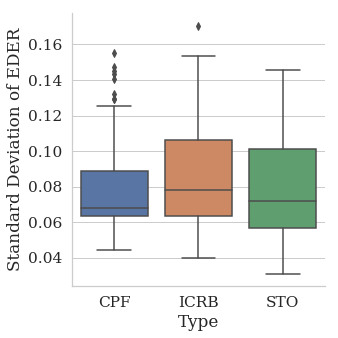

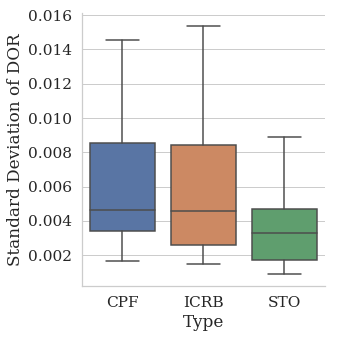

In [13]:
draw_std()

In [10]:
"""
def draw_distro_1(k, gid):
    data = df[(df['k'] == k) & (df['gid'] == gid)]
    draw_distro_helper_1(data, 'Ratio', (0, 1.1))
    draw_distro_helper_1(data, 'Times', (0, None))

def draw_distro_helper_1(d, var, rng):
    plt.figure(figsize = (6, 11))
    sns.set(font_scale = 1.2)
    sns.set_style('white', {'font.family':'serif', 'font.serif':'Times New Roman'})
    fig = sns.catplot(x=var, y='Type', data=d, kind="violin", orient="h", dodge = False)
    fig.savefig('./results_'+algo+'/distro_violin/' + str(gid) + '_' + str(k) + '_' + var + 'distro.eps')

for k in range(14):
    for gid in [1, 2, 3, 4]:
        draw_distro_1(k, gid)
"""

'\ndef draw_distro_1(k, gid):\n    data = df[(df[\'k\'] == k) & (df[\'gid\'] == gid)]\n    draw_distro_helper_1(data, \'Ratio\', (0, 1.1))\n    draw_distro_helper_1(data, \'Times\', (0, None))\n\ndef draw_distro_helper_1(d, var, rng):\n    plt.figure(figsize = (6, 11))\n    sns.set(font_scale = 1.2)\n    sns.set_style(\'white\', {\'font.family\':\'serif\', \'font.serif\':\'Times New Roman\'})\n    fig = sns.catplot(x=var, y=\'Type\', data=d, kind="violin", orient="h", dodge = False)\n    fig.savefig(\'./results_\'+algo+\'/distro_violin/\' + str(gid) + \'_\' + str(k) + \'_\' + var + \'distro.eps\')\n\nfor k in range(14):\n    for gid in [1, 2, 3, 4]:\n        draw_distro_1(k, gid)\n'

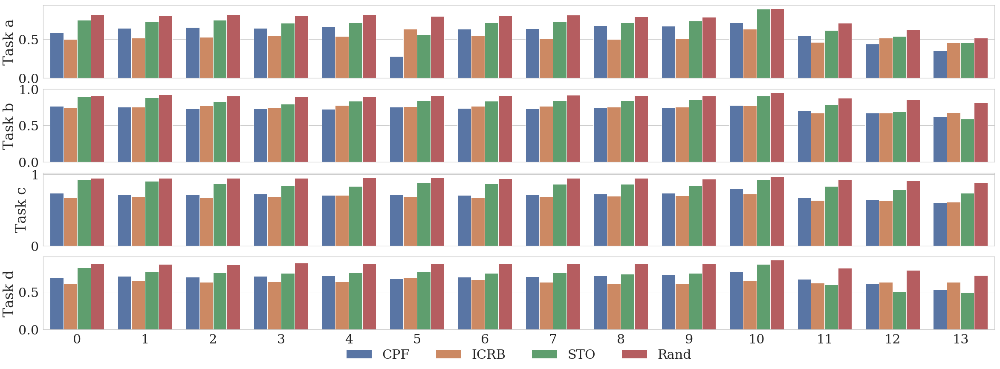

In [19]:
import matplotlib.gridspec as gridspec
gs = gridspec.GridSpec(4, 1)
gs.update(wspace=0.025, hspace=0.15)

def draw_boxx(gid, xaxis, yaxis, d):
    dd = ['', 'a', 'b', 'c', 'd']
    plt.subplot(gs[gid-1])
    ax = sns.barplot(x=xaxis, y=yaxis, hue="Type", data=d[d['gid'] == gid], ci = None, estimator=median)
    plt.ylabel('Task ' + dd[gid])
    if gid < 4:
        ax.axes.get_xaxis().set_visible(False)
        ax.get_legend().remove()
    else:
        plt.xlabel('')
        ax.legend(loc='lower center', bbox_to_anchor= (0.5,-0.5), ncol=4, borderaxespad=0, frameon=False)
    return ax

data = df
xaxis = 'Case'
data = data.rename(columns={'k': xaxis})

plt.figure(figsize = (40, 14))
sns.set(font_scale = 2.75)
sns.set_style('whitegrid', {'font.family':'serif', 'font.serif':'Times New Roman'})

for gid in [1, 2, 3, 4]:
    draw_boxx(gid, xaxis, 'EDER', data)

plt.savefig('./results_'+algo+'/boxx/' + 'EDER' + 'box.pdf')

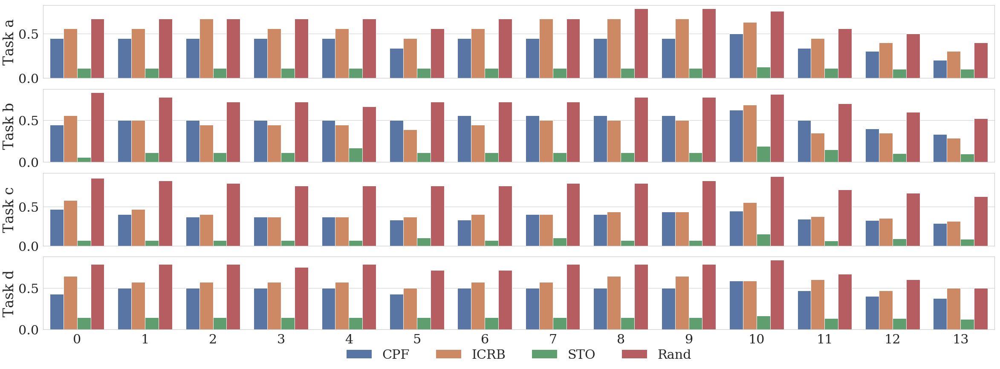

In [20]:
gs = gridspec.GridSpec(4, 1)
gs.update(wspace=0.025, hspace=0.15)

def draw_boxx(gid, xaxis, yaxis, d):
    dd = ['', 'a', 'b', 'c', 'd']
    plt.subplot(gs[gid-1])
    ax = sns.barplot(x=xaxis, y=yaxis, hue="Type", data=d[d['gid'] == gid], ci = None, estimator=median)
    plt.ylabel('Task ' + dd[gid])
    if gid < 4:
        ax.axes.get_xaxis().set_visible(False)
        ax.get_legend().remove()
    else:
        plt.xlabel('')
        ax.legend(loc='lower center', bbox_to_anchor= (0.5,-0.5), ncol=4, borderaxespad=0, frameon=False)
    return ax
    
data = df
"""
data = df[(df['k'] != 0) & (df['k'] != 5) & (df['k'] != 6) & (df['k'] != 10)]

data = data.replace({'k': {7: 5}})
data = data.replace({'k': {8: 6}})
data = data.replace({'k': {9: 7}})
data = data.replace({'k': {11: 8}})
data = data.replace({'k': {12: 9}})
data = data.replace({'k': {13: 10}})
"""
xaxis = 'Case'
data = data.rename(columns={'k': xaxis})

plt.figure(figsize = (40, 14))
sns.set(font_scale = 2.75)
sns.set_style('whitegrid', {'font.family':'serif', 'font.serif':'Times New Roman'})

for gid in [1, 2, 3, 4]:
    draw_boxx(gid, xaxis, 'DOR', data)

plt.savefig('./results_'+algo+'/boxx/' + 'DOR' + 'box.pdf')

In [13]:
"""
data = df[(df['k'] == 7) & (df['gid'] == 4)]

sns.set(font_scale = 2)
sns.set_style('whitegrid', {'font.family':'serif', 'font.serif':'Times New Roman'})

yaxis = 'Excution duration'
data = data.rename(columns={'Ratio': yaxis})
fig = sns.catplot(x='Type', y=yaxis, data=data, kind="box", height = 8, aspect = 0.8)
fig.savefig('./results_'+algo+'/slides/' + yaxis + 'box.png')

yaxis = 'Overheads'
data = data.rename(columns={'Times': yaxis})
fig = sns.catplot(x='Type', y=yaxis, data=data, kind="box", height = 8, aspect = 0.8)
fig.savefig('./results_'+algo'/slides/' + yaxis + 'box.png')
"""

'\ndata = df[(df[\'k\'] == 7) & (df[\'gid\'] == 4)]\n\nsns.set(font_scale = 2)\nsns.set_style(\'whitegrid\', {\'font.family\':\'serif\', \'font.serif\':\'Times New Roman\'})\n\nyaxis = \'Excution duration\'\ndata = data.rename(columns={\'Ratio\': yaxis})\nfig = sns.catplot(x=\'Type\', y=yaxis, data=data, kind="box", height = 8, aspect = 0.8)\nfig.savefig(\'./results_\'+algo+\'/slides/\' + yaxis + \'box.png\')\n\nyaxis = \'Overheads\'\ndata = data.rename(columns={\'Times\': yaxis})\nfig = sns.catplot(x=\'Type\', y=yaxis, data=data, kind="box", height = 8, aspect = 0.8)\nfig.savefig(\'./results_\'+algo\'/slides/\' + yaxis + \'box.png\')\n'

In [14]:
res = pd.DataFrame(columns=('gid', 'k', 'lower', 'upper'))
for k in range(14):
    for gid in [1, 2, 3, 4]:
        low = df[(df['k'] == k) & (df['gid'] == gid)]['Lower Bound']
        upp = df[(df['k'] == k) & (df['gid'] == gid)]['Upper Bound']
        res.loc[k*4+gid-1] = [gid, k, np.mean(low), np.mean(upp)]

In [15]:
res
res.to_csv('./results_'+algo+'/lowerupper.csv')

,a,b,c
0,0,1,2
